<p style="align: center;"><img src="https://static.tildacdn.com/tild6636-3531-4239-b465-376364646465/Deep_Learning_School.png", width=500></p>

<h3 style="text-align: center;"><b>Физтех-Школа Прикладной математики и информатики (ФПМИ) МФТИ</b></h3>

<h2 style="text-align: center;"><b>Object detection project</b></h2>

<p style="text-align: center;"><i>Руководитель проекта: Илья Захаркин (Сколтех, МФТИ) | @ilyazakharkin</i></p>

---

In [1]:
# Ссылка на ноутбук в коллабе:
# https://colab.research.google.com/drive/1qxrRkjafrzOVz2dbH_ttlg975Ctn3BfN?usp=sharing

# Ссылка на папку с весами модели и логами
# https://drive.google.com/drive/folders/1BHoA3oh0_NH44BXqsu7JwODSq3R4CLFA?usp=sharing

## Загружаем зависимости

In [ ]:
# install mmcv-full thus we could use CUDA operators
!pip install mmcv-full

# Install mmdetection
!rm -rf mmdetection
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection
!pip install -e .

!apt-get -q install tree

     |████████████████████████████████| 317kB 13.9MB/s 
     |████████████████████████████████| 194kB 25.1MB/s 
  Created wheel for mmcv-full: filename=mmcv_full-1.3.8-cp37-cp37m-linux_x86_64.whl size=29327644 sha256=200a0aedf6733a4a5e805809e9db0bf2e2d459c4142eb6f1b4459a8b10e83946
  Stored in directory: /root/.cache/pip/wheels/5a/0d/c3/627bb7a31df052473f9edd2812702d4a0b2e302cb6932c9a91
Successfully built mmcv-full
Cloning into 'mmdetection'...
remote: Enumerating objects: 19001, done.
remote: Counting objects: 100% (531/531), done.
remote: Compressing objects: 100% (263/263), done.
remote: Total 19001 (delta 335), reused 390 (delta 268), pack-reused 18470
Receiving objects: 100% (19001/19001), 21.78 MiB | 9.04 MiB/s, done.
Resolving deltas: 100% (13244/13244), done.
/content/mmdetection
Obtaining file:///content/mmdetection
  Created wheel for terminaltables: filename=terminaltables-3.1.0-cp37-none-any.whl size=15356 sha256=dc2b4ca50c681e8b570d0fd2d26dc8395680bc95696304e70a21e15eb738e1

In [ ]:
from IPython.display import clear_output
from google.colab import drive
from pathlib import Path
import os.path as osp
import os
import copy
import re
import xml.etree.ElementTree as ET
import numpy as np

from PIL import Image
import matplotlib.pyplot as plt 
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
import seaborn as sns
sns.set_style(style="whitegrid")

# Check Pytorch installation
import torch, torchvision

# Check MMDetection installation
import mmdet
from mmdet.datasets.builder import DATASETS
from mmdet.datasets import XMLDataset
from mmdet.apis import inference_detector, init_detector, show_result_pyplot
from mmdet.datasets import build_dataset
from mmdet.models import build_detector
from mmdet.apis import train_detector
from mmdet.apis import set_random_seed
from mmdet.datasets import build_dataset, build_dataloader
from mmdet.core.evaluation import eval_map, print_map_summary

import mmcv
from mmcv import Config
from mmcv.ops import get_compiling_cuda_version, get_compiler_version
from mmcv.runner import HOOKS, CheckpointHook, master_only, TensorboardLoggerHook
from mmcv.parallel import MMDataParallel

## Регистрируем модули для mmdetection

In [ ]:
@DATASETS.register_module()
class xml_dataset(XMLDataset):
    """XML dataset for detection"""

    CLASSES = ('pistol', 'knife')

    def load_annotations(self, ann_file):
        """Load annotation from XML style ann_file"""

        data_infos = []
        img_ids = mmcv.list_from_file(ann_file)
        for img_id in img_ids:
            filename = f'PNGImages/{img_id}.png'
            xml_path = osp.join(self.img_prefix, 'Annotations',
                                f'{img_id}.xml')
            tree = ET.parse(xml_path)
            root = tree.getroot()
            size = root.find('size')
            if size is not None:
                width = int(size.find('width').text)
                height = int(size.find('height').text)
            else:
                img_path = osp.join(self.img_prefix, 'PNGImages',
                                    '{}.png'.format(img_id))
                img = Image.open(img_path)
                width, height = img.size
            data_infos.append(
                dict(id=img_id, filename=filename, width=width, height=height))

        return data_infos

In [ ]:
@HOOKS.register_module()
class checkpoint(CheckpointHook):
    @master_only
    def _save_checkpoint(self, runner):
        """Save the current checkpoint"""
        runner.save_checkpoint(
            self.out_dir, save_optimizer=self.save_optimizer, **self.args)
        if runner.meta is not None:
            if self.by_epoch:
                cur_ckpt_filename = self.args.get(
                    'filename_tmpl', 'epoch_{}.pth').format(runner.epoch + 1)
            else:
                cur_ckpt_filename = self.args.get(
                    'filename_tmpl', 'iter_{}.pth').format(runner.iter + 1)
            runner.meta.setdefault('hook_msgs', dict())
            runner.meta['hook_msgs']['last_ckpt'] = os.path.join(
                self.out_dir, cur_ckpt_filename)

## Определяем функции

In [ ]:
def show_ground_truth(index , classes):  
    DATA = "/content/mmdetection/data/my_dataset/my_images/"
    # path
    im = osp.join(DATA, 'PNGImages/' + str(index) + '.png')
    if osp.isdir(osp.join(DATA, '/Annotations')):
        an = osp.join(DATA, 'Annotations/' + str(index) + '.xml')
    else:
        an = osp.join(DATA, 'Annotations/' + str(index) + '.xml')
    
    # get_ann_info:
    # cat2label = {cat: i for i, cat in enumerate(classes)}
    tree = ET.parse(an)
    root = tree.getroot()
    bboxes = []
    labels = []    
    for obj in root.findall('object'):
        name = obj.find('name').text
        if name not in classes:
            continue
        label = name      
        bnd_box = obj.find('bndbox')
        
        bbox = [
            int(float(bnd_box.find('xmin').text)),
            int(float(bnd_box.find('ymin').text)),
            int(float(bnd_box.find('xmax').text)),
            int(float(bnd_box.find('ymax').text))
        ]
                
        bboxes.append(bbox)
        labels.append(label)
    
    bboxes = np.array(bboxes, ndmin=2) - 1
    ann_label = np.array(labels)    
    ann_box = bboxes.astype(np.float32)
    # ann_labels=labels.astype(np.int64)

    # plot
    bbox_color = 'red'
    text_color = 'yellow'

    img = mmcv.imread(im).astype(np.uint8)
    img = mmcv.bgr2rgb(img)
    img = np.ascontiguousarray(img)
    
    fig = plt.figure(figsize=(8,8), frameon=False)
    plt.title(str(index))
    plt.subplots_adjust(left=0, right=1, bottom=0, top=1)
    ax = plt.gca()
    ax.axis('off')

    polygons = []
    color = []

    for i, (bbox, label) in enumerate(zip(ann_box, ann_label)):
        bbox_int = bbox.astype(np.int32)
        poly = [[bbox_int[0], bbox_int[1]], [bbox_int[0], bbox_int[3]],
                [bbox_int[2], bbox_int[3]], [bbox_int[2], bbox_int[1]]]
        np_poly = np.array(poly).reshape((4, 2))
        polygons.append(Polygon(np_poly))
        color.append(bbox_color)
        label_text = label
        ax.text(
            bbox_int[0],
            bbox_int[1],
            f'{label_text}',
            bbox={
                'facecolor': 'black',
                'alpha': 0.8,
                'pad': 0.7,
                'edgecolor': 'none'
            },
            color=text_color,
            fontsize=12,
            verticalalignment='top',
            horizontalalignment='left') 

    plt.imshow(img)

    p = PatchCollection(
        polygons, facecolor='none', edgecolors=color, linewidths=2)
    ax.add_collection(p)
    img = mmcv.rgb2bgr(img)      
    # return ann_box, ann_labels

## План
Часть 1. Детектор

1. Выбор фреймворка
2. Запуск предобученного детектора
3. Выбор датасета
4. Настройка конфигов детектора
5. Обучение модели детектора
6. Оценка качества работы детектора
7. Видео детекция


# Часть 1. Детектор

## Фреймворк

В качестве фреймворка для работы с задачей детекции используется `mmdetection` 
MMDetection - это тулбокс для детекции объектов с открытым исходным кодом.Основная ветка работает на PyTorch 1.3+.   
Repo: https://github.com/open-mmlab/mmdetection

## Инференс предобученного детекора

--2021-06-26 07:37:19--  https://download.openmmlab.com/mmdetection/v2.0/yolo/yolov3_d53_fp16_mstrain-608_273e_coco/yolov3_d53_fp16_mstrain-608_273e_coco_20210517_213542-4bc34944.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.254.186.225
Connecting to download.openmmlab.com (download.openmmlab.com)|47.254.186.225|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 124300154 (119M) [application/octet-stream]
Saving to: ‘yolov3_d53_fp16_mstrain-608_273e_coco_20210517_213542-4bc34944.pth’

yolov3_d53_fp16_mst 100%[===================>] 118.54M  7.87MB/s    in 15s     

2021-06-26 07:37:36 (7.80 MB/s) - ‘yolov3_d53_fp16_mstrain-608_273e_coco_20210517_213542-4bc34944.pth’ saved [124300154/124300154]



/content/mmdetection/mmdet/core/anchor/builder.py:16: UserWarning: ``build_anchor_generator`` would be deprecated soon, please use ``build_prior_generator`` 
  '``build_anchor_generator`` would be deprecated soon, please use '


Use load_from_local loader


/content/mmdetection/mmdet/datasets/utils.py:68: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  'data pipeline in your config file.', UserWarning)
/content/mmdetection/mmdet/core/anchor/anchor_generator.py:323: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/content/mmdetection/mmdet/core/anchor/anchor_generator.py:360: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


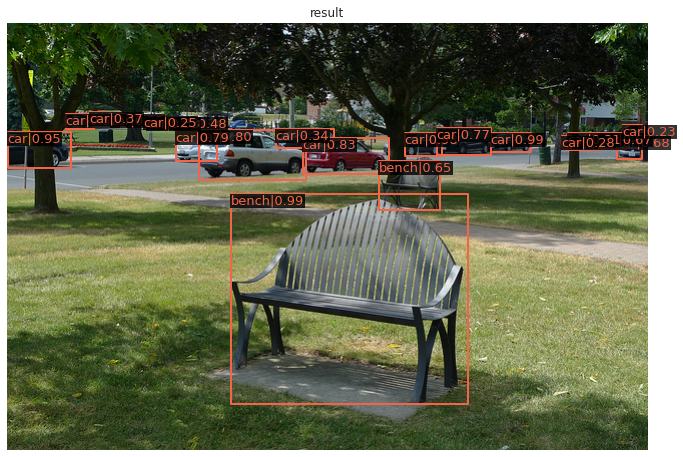

In [ ]:
!mkdir checkpoints
!wget -c https://download.openmmlab.com/mmdetection/v2.0/yolo/yolov3_d53_fp16_mstrain-608_273e_coco/yolov3_d53_fp16_mstrain-608_273e_coco_20210517_213542-4bc34944.pth \
      -O yolov3_d53_fp16_mstrain-608_273e_coco_20210517_213542-4bc34944.pth

# Choose to use a config and initialize the detector
config = './configs/yolo/yolov3_d53_mstrain-608_273e_coco.py'
# Setup a checkpoint file to load
checkpoint = 'yolov3_d53_fp16_mstrain-608_273e_coco_20210517_213542-4bc34944.pth'
# initialize the detector
model = init_detector(config, checkpoint, device='cuda:0')

# Use the detector to do inference
img = 'demo/demo.jpg'
result = inference_detector(model, img)

# Let's plot the result
show_result_pyplot(model, img, result, score_thr=0.2)

## Датасет


В качестве датасетов используются: [Pistol Dataset](https://makeml.app/datasets/pistol), [WeaponDetection](https://github.com/ari-dasci/OD-WeaponDetection)

Количество классов: 2  
Количество изображений: ~5050

In [ ]:
# !rm -r ./data
%mkdir -p "./data"
# Монитруем диск
drive.mount('/content/gdrive/', force_remount=True)

# Распаковываем архив с картинками 
!unzip -q /content/gdrive/MyDrive/my_dataset_pistlos.zip -d ./data
!unzip -q /content/gdrive/MyDrive/my_dataset_knifes.zip -d ./data

%mkdir -p "./data/my_dataset/my_images/Annotations"
%mkdir "./data/my_dataset/my_images/PNGImages"

%mv ./data/my_dataset_pistlos/my_images/annotations/* ./data/my_dataset/my_images/Annotations
%mv ./data/my_dataset_pistlos/my_images/PNGImages/* ./data/my_dataset/my_images/PNGImages

%mv ./data/my_dataset_knifes/my_images/annotations/* ./data/my_dataset/my_images/Annotations

full_path = Path('./data/my_dataset_knifes/my_images/JPGImages/')
new_path = "./data/my_dataset/my_images/PNGImages"
types = ('*.JPG', '*.jpg')

i=0
for type_ in types:
    for file_path in full_path.glob(type_):
        image = Image.open(file_path)
        image.save(os.path.join(new_path, file_path.stem+'.png'))
        i += 1
        if i >= 1000 and i%1000 == 0:
            print("1000")

! rm -r /content/mmdetection/data/my_dataset_knifes
! rm -r /content/mmdetection/data/my_dataset_pistlos


DATA = "./data/my_dataset/"
lst_images = []
p = Path('./data/my_dataset/my_images/PNGImages')
for name in p.glob('*.png'):
    lst_images.append(name.stem)
lst_images = np.array(lst_images)

val_size = 549
full_size = len(lst_images)

# Выбираем индексы для трейн, вал, теста 
indexes = np.random.choice(full_size, full_size, replace=False)
train, val, test = np.split(indexes, [4000, 4000+val_size])
print(len(train), len(val), len(test))

# Зaписываем имена файлов в документы
for ind, f_name in zip((train, val, test), ('train', 'val', 'test')):
    with open(os.path.join(DATA, f_name+"_anno.txt"), 'w') as file:
        file.writelines("%s\n" % line for line in lst_images[ind])

Mounted at /content/gdrive/
1000
1000
4000 549 500


PNGImages/pistols61.png
PNGImages/pistols1825.png
PNGImages/pistols1150.png
PNGImages/pistols2032.png
PNGImages/pistols2952.png
PNGImages/DSC_00321.png
PNGImages/pistols1086.png
PNGImages/KravMagaTraining4611.png
PNGImages/knife_405.png


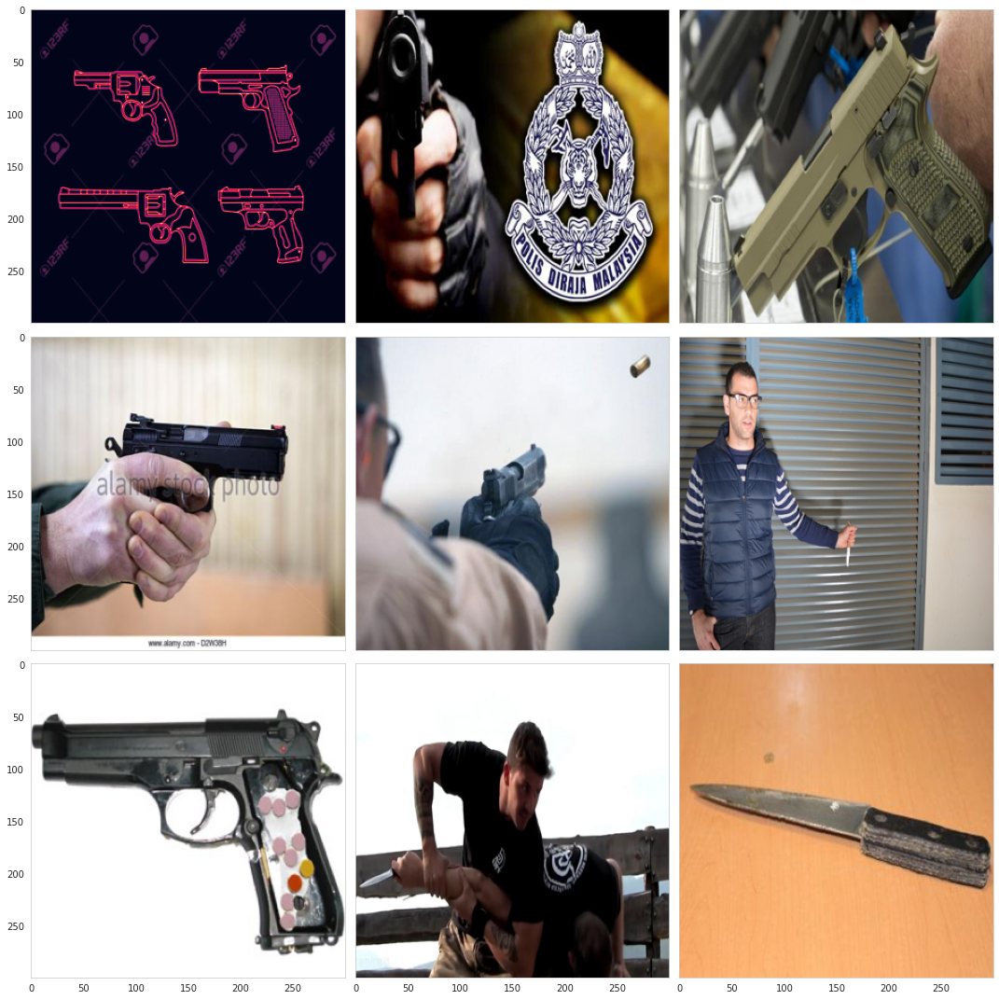

In [ ]:
# Картинки
# Рисуем 9 рандомных объектов
def imshow(inp, title=None, plt_ax=plt, default=False):
    plt_ax.imshow(inp)
    if title is not None:
        plt_ax.set_title(title)
    plt_ax.grid(False)

img_prefix = "./data/my_dataset/my_images"
img_ids = mmcv.list_from_file( "./data/my_dataset/train_anno.txt")

fig, ax = plt.subplots(nrows=3, ncols=3,figsize=(15, 15), \
                        sharey=True, sharex=True)
for fig_x in ax.flatten():
    random_characters = int(np.random.uniform(0,1500))
    filename = f'PNGImages/{img_ids[random_characters]}.png'
    print(filename)
    filepath = osp.join(img_prefix, filename)
    image = Image.open(filepath)
    image = image.resize((300, 300))
    imshow(np.array(image), plt_ax=fig_x) # title=img_label,
plt.tight_layout()
plt.show()

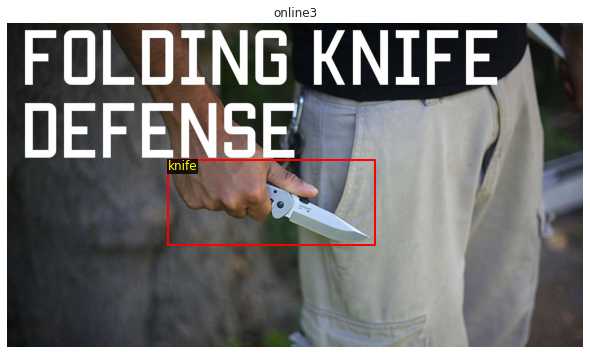

In [ ]:
show_ground_truth(index="online3" , classes = "knife")

## Настройка конфигов

In [ ]:
model_type = "YOLOV3"
cfg = Config.fromfile('./configs/yolo/yolov3_d53_mstrain-608_273e_coco.py')

cfg.model.bbox_head.num_classes = 2
cfg.load_from = 'yolov3_d53_fp16_mstrain-608_273e_coco_20210517_213542-4bc34944.pth'

# Set up working dir to save files and logs.
cfg.work_dir = '/content/gdrive/MyDrive/tensor'


cfg.runner = dict(type='EpochBasedRunner', max_epochs=20)
cfg.data.samples_per_gpu = 10
cfg.data.workers_per_gpu = 1


# Modify dataset type and path
dataset_name = 'xml_dataset'
cfg.dataset_type = dataset_name
cfg.data_root = './data/my_dataset/'

cfg.data.test.type = dataset_name
cfg.data.test.data_root = './data/my_dataset/'
cfg.data.test.ann_file = 'test_anno.txt'
cfg.data.test.img_prefix = 'my_images/'


cfg.data.train.type = dataset_name
cfg.data.train.data_root = './data/my_dataset/'
cfg.data.train.ann_file = 'train_anno.txt'
cfg.data.train.img_prefix = 'my_images/'

cfg.data.val.type = dataset_name
cfg.data.val.data_root = './data/my_dataset/'
cfg.data.val.ann_file = 'val_anno.txt'
cfg.data.val.img_prefix = 'my_images/'

cfg.workflow = [('train', 1)] # , ('val', 1)


hooks = [dict(type='TensorboardLoggerHook'), 
         dict(type='TextLoggerHook')
         ]

cfg.log_config.hooks = hooks

cfg.log_config.interval = 50 

cfg.custom_hooks = [
    dict(type='logger_hook'),                                
    dict(type='checkpoint'), 
    dict(type='NumClassCheckHook')
    ]


# Set seed thus the results are more reproducible
cfg.seed = 0
set_random_seed(0, deterministic=False)
cfg.gpu_ids = [0]

cfg.optimizer.lr = 3e-4 

# cfg.lr_config.step = [24, 32]
cfg.lr_config.warmup_ratio = 1.0 / 1e5

# Change the evaluation metric since we use customized dataset.
cfg.evaluation.metric = 'mAP'
# We can set the evaluation interval to reduce the evaluation times
cfg.evaluation.interval = 2 # Это эпохи
# We can set the checkpoint saving interval to reduce the storage cost
cfg.checkpoint_config.interval = 2 # Это эпох2

In [ ]:
print(f'Config:\n{cfg.pretty_text}')

Config:
checkpoint_config = dict(interval=2)
log_config = dict(
    interval=50,
    hooks=[dict(type='TensorboardLoggerHook'),
           dict(type='TextLoggerHook')])
custom_hooks = [
    dict(type='logger_hook'),
    dict(type='checkpoint'),
    dict(type='NumClassCheckHook')
]
dist_params = dict(backend='nccl')
log_level = 'INFO'
load_from = 'yolov3_d53_fp16_mstrain-608_273e_coco_20210517_213542-4bc34944.pth'
resume_from = None
workflow = [('train', 1)]
model = dict(
    type='YOLOV3',
    backbone=dict(
        type='Darknet',
        depth=53,
        out_indices=(3, 4, 5),
        init_cfg=dict(type='Pretrained', checkpoint='open-mmlab://darknet53')),
    neck=dict(
        type='YOLOV3Neck',
        num_scales=3,
        in_channels=[1024, 512, 256],
        out_channels=[512, 256, 128]),
    bbox_head=dict(
        type='YOLOV3Head',
        num_classes=2,
        in_channels=[512, 256, 128],
        out_channels=[1024, 512, 256],
        anchor_generator=dict(
            typ

In [ ]:
fname = "/content/gdrive/MyDrive/tensor/cfg.py"
cfg.dump(fname)

## Обучение модели-детектора 

In [ ]:
# import gc
# model_1=None
# gc.collect()

5385

In [ ]:
# Build dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model_1 = build_detector(cfg.model) 
# Add an attribute for visualization convenience
model_1.CLASSES = datasets[0].CLASSES

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))

/content/mmdetection/mmdet/core/anchor/builder.py:16: UserWarning: ``build_anchor_generator`` would be deprecated soon, please use ``build_prior_generator`` 
  '``build_anchor_generator`` would be deprecated soon, please use '


In [ ]:
train_detector(model_1, datasets, cfg, distributed=False, validate=True)

2021-06-26 08:23:13,177 - mmdet - INFO - load checkpoint from yolov3_d53_fp16_mstrain-608_273e_coco_20210517_213542-4bc34944.pth
2021-06-26 08:23:13,179 - mmdet - INFO - Use load_from_local loader
2021-06-26 08:23:14,884 - mmdet - WARNING - The model and loaded state dict do not match exactly

size mismatch for bbox_head.convs_pred.0.weight: copying a param with shape torch.Size([255, 1024, 1, 1]) from checkpoint, the shape in current model is torch.Size([21, 1024, 1, 1]).
size mismatch for bbox_head.convs_pred.0.bias: copying a param with shape torch.Size([255]) from checkpoint, the shape in current model is torch.Size([21]).
size mismatch for bbox_head.convs_pred.1.weight: copying a param with shape torch.Size([255, 512, 1, 1]) from checkpoint, the shape in current model is torch.Size([21, 512, 1, 1]).
size mismatch for bbox_head.convs_pred.1.bias: copying a param with shape torch.Size([255]) from checkpoint, the shape in current model is torch.Size([21]).
size mismatch for bbox_head

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 549/549, 28.2 task/s, elapsed: 19s, ETA:     0s
---------------iou_thr: 0.5---------------


2021-06-26 08:30:39,869 - mmdet - INFO - 
+--------+-----+------+--------+-------+
| class  | gts | dets | recall | ap    |
+--------+-----+------+--------+-------+
| pistol | 392 | 4670 | 0.880  | 0.469 |
| knife  | 224 | 4647 | 0.897  | 0.517 |
+--------+-----+------+--------+-------+
| mAP    |     |      |        | 0.493 |
+--------+-----+------+--------+-------+
2021-06-26 08:31:08,242 - mmdet - INFO - Epoch [3][50/401]	lr: 1.277e-04, eta: 1:03:07, time: 0.567, data_time: 0.212, memory: 9390, loss_cls: 10.5206, loss_conf: 38.4245, loss_xy: 31.5664, loss_wh: 2.0002, loss: 82.5118, grad_norm: 535.5022
2021-06-26 08:31:37,020 - mmdet - INFO - Epoch [3][100/401]	lr: 1.352e-04, eta: 1:02:59, time: 0.576, data_time: 0.224, memory: 9390, loss_cls: 10.0402, loss_conf: 40.8160, loss_xy: 31.2407, loss_wh: 2.0135, loss: 84.1104, grad_norm: 568.0704
2021-06-26 08:31:59,916 - mmdet - INFO - Epoch [3][150/401]	lr: 1.427e-04, eta: 1:02:06, time: 0.458, data_time: 0.093, memory: 9390, loss_cls: 9

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 549/549, 27.8 task/s, elapsed: 20s, ETA:     0s
---------------iou_thr: 0.5---------------


2021-06-26 08:38:07,278 - mmdet - INFO - 
+--------+-----+------+--------+-------+
| class  | gts | dets | recall | ap    |
+--------+-----+------+--------+-------+
| pistol | 392 | 1993 | 0.883  | 0.602 |
| knife  | 224 | 2006 | 0.946  | 0.714 |
+--------+-----+------+--------+-------+
| mAP    |     |      |        | 0.658 |
+--------+-----+------+--------+-------+
2021-06-26 08:38:36,464 - mmdet - INFO - Epoch [5][50/401]	lr: 2.480e-04, eta: 0:56:07, time: 0.583, data_time: 0.234, memory: 9390, loss_cls: 2.6788, loss_conf: 24.8693, loss_xy: 29.4706, loss_wh: 1.9070, loss: 58.9257, grad_norm: 553.9415
2021-06-26 08:39:01,794 - mmdet - INFO - Epoch [5][100/401]	lr: 2.555e-04, eta: 0:55:36, time: 0.507, data_time: 0.133, memory: 9390, loss_cls: 2.3375, loss_conf: 27.0565, loss_xy: 28.9782, loss_wh: 1.6589, loss: 60.0311, grad_norm: 587.0473
2021-06-26 08:39:27,834 - mmdet - INFO - Epoch [5][150/401]	lr: 2.630e-04, eta: 0:55:08, time: 0.521, data_time: 0.162, memory: 9390, loss_cls: 2.7

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 549/549, 26.8 task/s, elapsed: 20s, ETA:     0s
---------------iou_thr: 0.5---------------


2021-06-26 08:45:33,850 - mmdet - INFO - 
+--------+-----+------+--------+-------+
| class  | gts | dets | recall | ap    |
+--------+-----+------+--------+-------+
| pistol | 392 | 1757 | 0.885  | 0.603 |
| knife  | 224 | 1664 | 0.969  | 0.890 |
+--------+-----+------+--------+-------+
| mAP    |     |      |        | 0.746 |
+--------+-----+------+--------+-------+
2021-06-26 08:46:05,844 - mmdet - INFO - Epoch [7][50/401]	lr: 3.000e-04, eta: 0:49:05, time: 0.639, data_time: 0.275, memory: 9390, loss_cls: 1.4168, loss_conf: 25.1228, loss_xy: 29.8217, loss_wh: 1.5206, loss: 57.8820, grad_norm: 550.2433
2021-06-26 08:46:32,479 - mmdet - INFO - Epoch [7][100/401]	lr: 3.000e-04, eta: 0:48:39, time: 0.533, data_time: 0.169, memory: 9390, loss_cls: 0.9968, loss_conf: 23.3449, loss_xy: 29.4989, loss_wh: 1.3983, loss: 55.2390, grad_norm: 512.7831
2021-06-26 08:47:00,355 - mmdet - INFO - Epoch [7][150/401]	lr: 3.000e-04, eta: 0:48:16, time: 0.558, data_time: 0.186, memory: 9390, loss_cls: 1.0

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 549/549, 26.6 task/s, elapsed: 21s, ETA:     0s
---------------iou_thr: 0.5---------------


2021-06-26 08:53:11,391 - mmdet - INFO - 
+--------+-----+------+--------+-------+
| class  | gts | dets | recall | ap    |
+--------+-----+------+--------+-------+
| pistol | 392 | 1336 | 0.870  | 0.753 |
| knife  | 224 | 1377 | 0.946  | 0.842 |
+--------+-----+------+--------+-------+
| mAP    |     |      |        | 0.797 |
+--------+-----+------+--------+-------+
2021-06-26 08:53:41,790 - mmdet - INFO - Epoch [9][50/401]	lr: 3.000e-04, eta: 0:42:10, time: 0.608, data_time: 0.242, memory: 9390, loss_cls: 0.8492, loss_conf: 19.4415, loss_xy: 28.3281, loss_wh: 1.1990, loss: 49.8178, grad_norm: 468.8971
2021-06-26 08:54:09,299 - mmdet - INFO - Epoch [9][100/401]	lr: 3.000e-04, eta: 0:41:45, time: 0.550, data_time: 0.184, memory: 9390, loss_cls: 0.7162, loss_conf: 20.5214, loss_xy: 28.6788, loss_wh: 1.4681, loss: 51.3844, grad_norm: 500.0768
2021-06-26 08:54:36,094 - mmdet - INFO - Epoch [9][150/401]	lr: 3.000e-04, eta: 0:41:19, time: 0.536, data_time: 0.172, memory: 9390, loss_cls: 0.8

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 549/549, 27.1 task/s, elapsed: 20s, ETA:     0s
---------------iou_thr: 0.5---------------


2021-06-26 09:00:43,563 - mmdet - INFO - 
+--------+-----+------+--------+-------+
| class  | gts | dets | recall | ap    |
+--------+-----+------+--------+-------+
| pistol | 392 | 1160 | 0.898  | 0.798 |
| knife  | 224 | 1149 | 0.960  | 0.913 |
+--------+-----+------+--------+-------+
| mAP    |     |      |        | 0.856 |
+--------+-----+------+--------+-------+
2021-06-26 09:01:10,659 - mmdet - INFO - Epoch [11][50/401]	lr: 3.000e-04, eta: 0:35:02, time: 0.542, data_time: 0.165, memory: 9390, loss_cls: 0.5566, loss_conf: 18.4531, loss_xy: 28.7103, loss_wh: 1.1008, loss: 48.8209, grad_norm: 450.6054
2021-06-26 09:01:35,609 - mmdet - INFO - Epoch [11][100/401]	lr: 3.000e-04, eta: 0:34:34, time: 0.499, data_time: 0.123, memory: 9390, loss_cls: 0.5265, loss_conf: 21.9496, loss_xy: 29.4596, loss_wh: 1.1845, loss: 53.1203, grad_norm: 523.3043
2021-06-26 09:02:03,537 - mmdet - INFO - Epoch [11][150/401]	lr: 3.000e-04, eta: 0:34:09, time: 0.559, data_time: 0.195, memory: 9390, loss_cls: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 549/549, 27.0 task/s, elapsed: 20s, ETA:     0s
---------------iou_thr: 0.5---------------


2021-06-26 09:08:17,666 - mmdet - INFO - 
+--------+-----+------+--------+-------+
| class  | gts | dets | recall | ap    |
+--------+-----+------+--------+-------+
| pistol | 392 | 1097 | 0.890  | 0.816 |
| knife  | 224 | 1024 | 0.951  | 0.909 |
+--------+-----+------+--------+-------+
| mAP    |     |      |        | 0.863 |
+--------+-----+------+--------+-------+
2021-06-26 09:08:46,792 - mmdet - INFO - Epoch [13][50/401]	lr: 3.000e-04, eta: 0:28:00, time: 0.582, data_time: 0.213, memory: 9390, loss_cls: 0.3959, loss_conf: 18.4990, loss_xy: 30.1830, loss_wh: 1.1420, loss: 50.2199, grad_norm: 460.1832
2021-06-26 09:09:13,696 - mmdet - INFO - Epoch [13][100/401]	lr: 3.000e-04, eta: 0:27:34, time: 0.538, data_time: 0.176, memory: 9390, loss_cls: 0.4524, loss_conf: 19.2939, loss_xy: 28.5241, loss_wh: 1.1571, loss: 49.4275, grad_norm: 484.7296
2021-06-26 09:09:41,607 - mmdet - INFO - Epoch [13][150/401]	lr: 3.000e-04, eta: 0:27:08, time: 0.558, data_time: 0.188, memory: 9390, loss_cls: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 549/549, 27.0 task/s, elapsed: 20s, ETA:     0s
---------------iou_thr: 0.5---------------


2021-06-26 09:15:49,947 - mmdet - INFO - 
+--------+-----+------+--------+-------+
| class  | gts | dets | recall | ap    |
+--------+-----+------+--------+-------+
| pistol | 392 | 1170 | 0.860  | 0.761 |
| knife  | 224 | 1145 | 0.964  | 0.896 |
+--------+-----+------+--------+-------+
| mAP    |     |      |        | 0.829 |
+--------+-----+------+--------+-------+
2021-06-26 09:16:19,364 - mmdet - INFO - Epoch [15][50/401]	lr: 3.000e-04, eta: 0:20:54, time: 0.588, data_time: 0.222, memory: 9390, loss_cls: 0.2709, loss_conf: 16.8886, loss_xy: 26.7463, loss_wh: 1.0365, loss: 44.9423, grad_norm: 446.9282
2021-06-26 09:16:47,218 - mmdet - INFO - Epoch [15][100/401]	lr: 3.000e-04, eta: 0:20:28, time: 0.557, data_time: 0.195, memory: 9390, loss_cls: 0.3445, loss_conf: 16.6008, loss_xy: 28.8704, loss_wh: 1.0347, loss: 46.8504, grad_norm: 440.2669
2021-06-26 09:17:14,467 - mmdet - INFO - Epoch [15][150/401]	lr: 3.000e-04, eta: 0:20:01, time: 0.545, data_time: 0.184, memory: 9390, loss_cls: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 549/549, 27.0 task/s, elapsed: 20s, ETA:     0s
---------------iou_thr: 0.5---------------


2021-06-26 09:23:21,841 - mmdet - INFO - 
+--------+-----+------+--------+-------+
| class  | gts | dets | recall | ap    |
+--------+-----+------+--------+-------+
| pistol | 392 | 974  | 0.890  | 0.777 |
| knife  | 224 | 1039 | 0.964  | 0.902 |
+--------+-----+------+--------+-------+
| mAP    |     |      |        | 0.840 |
+--------+-----+------+--------+-------+
2021-06-26 09:23:52,727 - mmdet - INFO - Epoch [17][50/401]	lr: 3.000e-04, eta: 0:13:48, time: 0.617, data_time: 0.265, memory: 9390, loss_cls: 0.3778, loss_conf: 16.5623, loss_xy: 30.1671, loss_wh: 1.1479, loss: 48.2552, grad_norm: 468.4829
2021-06-26 09:24:19,222 - mmdet - INFO - Epoch [17][100/401]	lr: 3.000e-04, eta: 0:13:21, time: 0.530, data_time: 0.174, memory: 9390, loss_cls: 0.2779, loss_conf: 13.3582, loss_xy: 27.6795, loss_wh: 0.7346, loss: 42.0501, grad_norm: 433.7834
2021-06-26 09:24:45,658 - mmdet - INFO - Epoch [17][150/401]	lr: 3.000e-04, eta: 0:12:54, time: 0.529, data_time: 0.159, memory: 9390, loss_cls: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 549/549, 26.9 task/s, elapsed: 20s, ETA:     0s
---------------iou_thr: 0.5---------------


2021-06-26 09:30:54,215 - mmdet - INFO - 
+--------+-----+------+--------+-------+
| class  | gts | dets | recall | ap    |
+--------+-----+------+--------+-------+
| pistol | 392 | 874  | 0.857  | 0.807 |
| knife  | 224 | 902  | 0.960  | 0.914 |
+--------+-----+------+--------+-------+
| mAP    |     |      |        | 0.861 |
+--------+-----+------+--------+-------+
2021-06-26 09:31:25,163 - mmdet - INFO - Epoch [19][50/401]	lr: 3.000e-04, eta: 0:06:40, time: 0.619, data_time: 0.260, memory: 9390, loss_cls: 0.2274, loss_conf: 13.9964, loss_xy: 27.5427, loss_wh: 0.8142, loss: 42.5808, grad_norm: 418.3928
2021-06-26 09:31:51,181 - mmdet - INFO - Epoch [19][100/401]	lr: 3.000e-04, eta: 0:06:14, time: 0.520, data_time: 0.154, memory: 9390, loss_cls: 0.2670, loss_conf: 18.2434, loss_xy: 29.4737, loss_wh: 1.0060, loss: 48.9901, grad_norm: 458.2191
2021-06-26 09:32:16,993 - mmdet - INFO - Epoch [19][150/401]	lr: 3.000e-04, eta: 0:05:47, time: 0.516, data_time: 0.159, memory: 9390, loss_cls: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 549/549, 26.8 task/s, elapsed: 20s, ETA:     0s
---------------iou_thr: 0.5---------------


2021-06-26 09:38:28,405 - mmdet - INFO - 
+--------+-----+------+--------+-------+
| class  | gts | dets | recall | ap    |
+--------+-----+------+--------+-------+
| pistol | 392 | 882  | 0.895  | 0.831 |
| knife  | 224 | 750  | 0.960  | 0.920 |
+--------+-----+------+--------+-------+
| mAP    |     |      |        | 0.876 |
+--------+-----+------+--------+-------+
2021-06-26 09:38:28,412 - mmdet - INFO - Saving checkpoint at 20 epochs


In [ ]:
# Открываем борд в среде
%load_ext tensorboard
%tensorboard --logdir /content/gdrive/MyDrive/tensor/tf_logs

<IPython.core.display.Javascript object>

## Измерение качества модели

In [ ]:
# init detector, cfg and checkpoints
cfg = Config.fromfile('/content/gdrive/MyDrive/tensor/cfg.py')
checkpoint = '/content/gdrive/MyDrive/tensor/latest.pth'
test_dataset = build_dataset(cfg.data.test, dict(test_mode=True))
annos = [test_dataset.get_ann_info(i) for i in range(len(test_dataset))]
gt_bboxes = [anno["bboxes"] for anno in annos]
test_dataloader = build_dataloader(test_dataset, 1, cfg.data.workers_per_gpu, # cfg.data.samples_per_gpu
                                   dist=False, shuffle=False)

model = init_detector(cfg, checkpoint, device='cuda:0')
model_for_test = MMDataParallel(model.cuda(cfg.gpu_ids[0]), device_ids=cfg.gpu_ids)

/content/mmdetection/mmdet/core/anchor/builder.py:16: UserWarning: ``build_anchor_generator`` would be deprecated soon, please use ``build_prior_generator`` 
  '``build_anchor_generator`` would be deprecated soon, please use '


Use load_from_local loader


/content/mmdetection/mmdet/datasets/utils.py:68: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  'data pipeline in your config file.', UserWarning)
/content/mmdetection/mmdet/core/anchor/anchor_generator.py:323: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/content/mmdetection/mmdet/core/anchor/anchor_generator.py:360: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


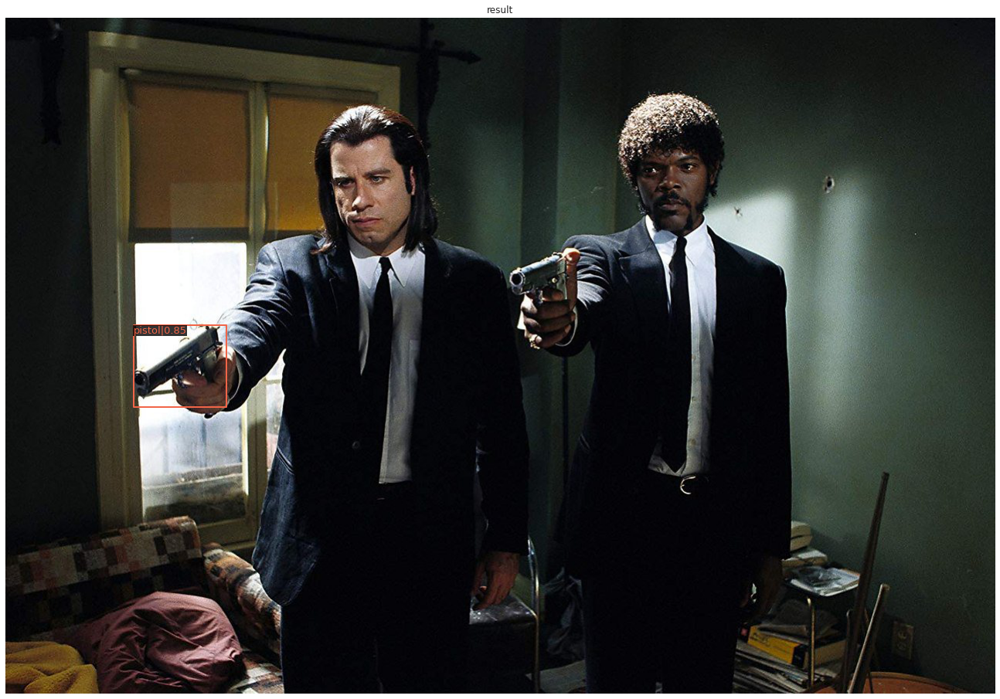

In [ ]:
# Single image inference
img = mmcv.imread('/content/gdrive/MyDrive/2802147451.png')
result = inference_detector(model, img)
show_result_pyplot(model, img, result)

In [ ]:
# Multi image inference
model_for_test.eval()
results = []

for i, data in enumerate(test_dataloader):
    with torch.no_grad():
        result = model_for_test(return_loss=False, rescale=True, **data)
    results.extend(result)
# result shape: (num_of_obj, num_of_classes, num_of_boxes, results_fo_each_box=5)

/content/mmdetection/mmdet/core/anchor/anchor_generator.py:323: UserWarning: ``grid_anchors`` would be deprecated soon. Please use ``grid_priors`` 
  warnings.warn('``grid_anchors`` would be deprecated soon. '
/content/mmdetection/mmdet/core/anchor/anchor_generator.py:360: UserWarning: ``single_level_grid_anchors`` would be deprecated soon. Please use ``single_level_grid_priors`` 
  '``single_level_grid_anchors`` would be deprecated soon. '


In [ ]:
mean_ap, eval_results = eval_map(det_results=results, annotations=annos, iou_thr=0.5, nproc=4)


+-------+-----+------+--------+-------+
| class | gts | dets | recall | ap    |
+-------+-----+------+--------+-------+
| 0     | 331 | 732  | 0.915  | 0.847 |
| 1     | 216 | 636  | 0.963  | 0.928 |
+-------+-----+------+--------+-------+
| mAP   |     |      |        | 0.887 |
+-------+-----+------+--------+-------+


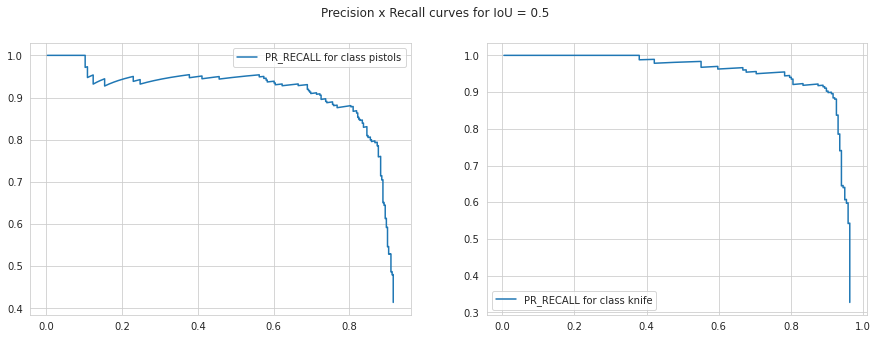

In [ ]:
precision_1 = eval_results[0]["precision"]
recall_1 = eval_results[0]["recall"]

precision_2 = eval_results[1]["precision"]
recall_2 = eval_results[1]["recall"]

fig, axes = plt.subplots(1,2, figsize=(15, 5))

axes[0].plot(recall_1, precision_1, label = "PR_RECALL for class pistols")
axes[1].plot(recall_2, precision_2, label = "PR_RECALL for class knife")
axes[0].legend()
axes[1].legend()

plt.suptitle("Precision x Recall curves for IoU = 0.5")
plt.show()

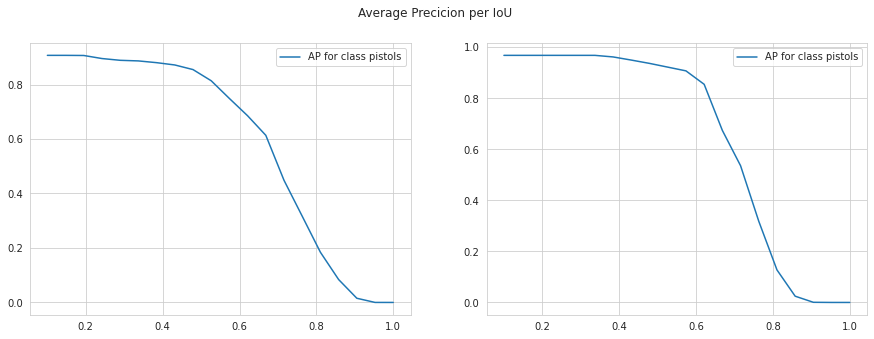

In [ ]:
av_precisions_0 = []
av_precisions_1 = []

for i in np.linspace(0.1,1,20):
    mean_ap, eval_results = eval_map(det_results=results, annotations=annos, iou_thr=i, nproc=4)
    clear_output(wait=True)
    
    ap_1 = eval_results[0]["ap"]
    ap_2 = eval_results[1]["ap"]

    av_precisions_0.append(ap_1)
    av_precisions_1.append(ap_2)


fig, axes = plt.subplots(1,2, figsize=(15, 5))
axes[0].plot(np.linspace(0.1,1,20), av_precisions_0, label = "AP for class pistols")
axes[1].plot(np.linspace(0.1,1,20), av_precisions_1, label = "AP for class pistols")
axes[0].legend()
axes[1].legend()

plt.suptitle("Average Precicion per IoU")
plt.show()

## Видео детекция

mkdir: cannot create directory ‘./my_video’: File exists
[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 376/376, 14.3 task/s, elapsed: 26s, ETA:     0s


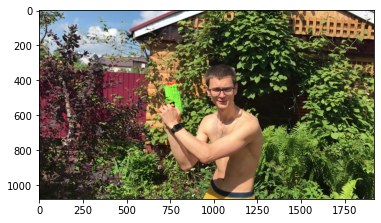

In [ ]:
# !rm -r ./my_video
!mkdir ./my_video

video_path = "/content/gdrive/MyDrive/IMG_8571.mp4"
# test a video and show the results
video = mmcv.VideoReader(video_path)
i = 0
for img in video:
    result = inference_detector(model_1, img)
    model_1.show_result(img, result, wait_time=1, show=True, out_file='./my_video/result_img_'+ str(i) + '.png', thickness=4)
    i+=1

path_1 = "./my_video/result_img_1.png"
image = Image.open(path_1)
plt.imshow(image)

mmcv.frames2video('./my_video', './SWAT.mp4', filename_tmpl='result_img_'+'{:01d}.png')

## Применение модели в реал лайф задачах

Мой выбор пал на решение задачи детекции оружия ввиду событий, произошедших 11 мая 2020 года в Казани. В целом, это далеко не новая история и, к несчастью, далеко не последняя. Большинство экспертов считают, что превентивное отслеживание подобных инцидентов - задача за гранью возможного, так как крайне сложно понять в какой именно момент очередному придурку сорвет чердак, и он возомнит себя богом. Увеличение штата школьных психологов, вероятно, может несколько снизить риски шутингов, но что делать в той ситуации, когда все кордоны прорваны, котелок закипел, и человек с ружьем вышел на улицу?  

Случай в Казани показал, что надеяться на добропорядочность граждан в подобных ситуациях не стоит. Возможно, кому-то и показалось, что человек с ружьем на улице - вещь несколько неуместная в современном городе, не на диком же западе живем, но к несчастью, в полицию никто позвонить не захотел. Можно найти массу причин подобного поведения, но сейчас не об этом.   

Рассмотренный кейс доказывает, что городу необходима масштабная сеть видеонаблюдения, подключенная к единой системе распознавания образов. Сеть, которая способна отслеживать и своевременно выявлять объекты, которые могут быть опасны для горожан. Нельзя со стопроцентной уверенностью утверждать, что в конкретном кейсе Казанского шутинга подобная система могла бы что-то изменить, но я вполне допускаю, что своевременное оповещение экстренных служб о маньяке с ружьем на улице мирного города – беспрецедентная возможность многократно повысить безопасность улиц, по которым ходят добропорядочные люди.   

Система по детекции ножей и пистолетов, реализованная в этом проекте, выглядит довольно наивно, но она вполне неплохо справляется с задачей демонстрации возможностей современных технологий и приближает нас к новому дивному миру, что ждет нас с вами уже буквально завтра.  
  
  
Минимальный набор мер по внедрению системы детекции в городе:
- Провести камапанию по раъяснению населению преимуществ наличия системы детекции в городе
- установить камеры видеонаблюдения по городу, начиная с самых ответственных участков - школ, общественных учреждений, туристических мест и мест скопления людей.
- настроить систему сбора и обработки видео-потоков.
- обучить модель дополнительно определять разницу между игрушечным и настоящим оружием на новом размеченном датасете.
- настроить систему оповещения при обнаружении моделью оружия на видео.
